In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 5GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/images-new/img2.jpeg
/kaggle/input/images-new/img3.jpeg
/kaggle/input/images-new/img1.jpeg
/kaggle/input/images-new/img4.jpeg


In [2]:
import os, sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import skimage.io
from skimage.transform import resize
from imgaug import augmenters as iaa
from tqdm import tqdm
import PIL
from PIL import Image, ImageOps
import cv2
from sklearn.utils import class_weight, shuffle
from keras.losses import binary_crossentropy
from keras.applications.resnet50 import preprocess_input
import keras.backend as K
import tensorflow as tf
from sklearn.metrics import f1_score, fbeta_score
from keras.utils import Sequence
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split

WORKERS = 2
CHANNEL = 3

import warnings
warnings.filterwarnings("ignore")
IMG_SIZE = 512
NUM_CLASSES = 5
SEED = 77
TRAIN_NUM = 1000 # use 1000 when you just want to explore new idea, use -1 for full train

In [3]:
def read_img(img_path):
    img = cv2.imread(img_path, cv2.IMREAD_COLOR)
    img = cv2.resize(img, (IMG_SIZE,IMG_SIZE))
    return img

In [4]:
img1=read_img('../input/images-new/img1.jpeg')
img2=read_img('../input/images-new/img2.jpeg')
img3=read_img('../input/images-new/img3.jpeg')
img4=read_img('../input/images-new/img4.jpeg')

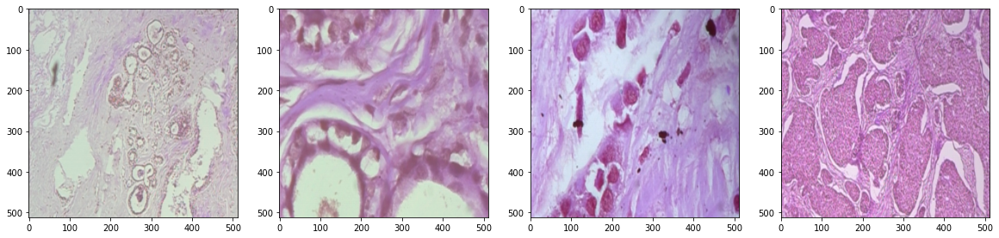

In [5]:
plt.figure(figsize=(20,5))
plt.subplot(1,4,1)
plt.imshow(img1)
plt.subplot(1,4,2)
plt.imshow(img2)
plt.subplot(1,4,3)
plt.imshow(img3)
plt.subplot(1,4,4)
plt.imshow(img4)

In [6]:
img_list=[img1,img2,img3,img4]

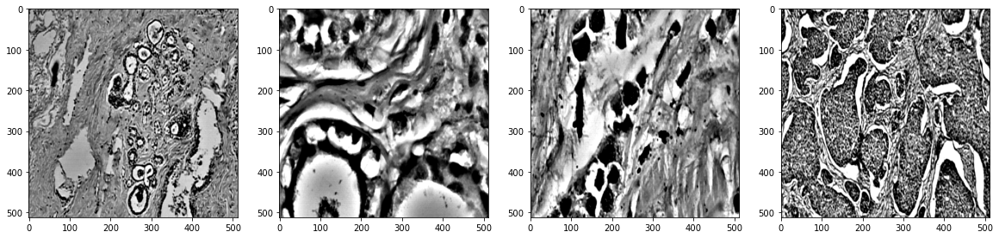

In [7]:
plt.figure(figsize=(20,5))
for i in range(1,5):
    image = cv2.cvtColor(img_list[i-1], cv2.COLOR_BGR2GRAY)
    image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
    image=cv2.addWeighted ( image, 4 , cv2.GaussianBlur( image , (0 ,0 ) , 30) ,-4 ,128)
    plt.subplot(1,4,i)
    plt.imshow(image,cmap='gray')

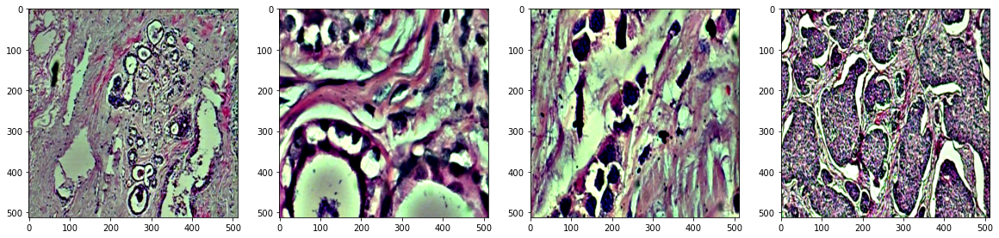

In [8]:
plt.figure(figsize=(20,5))
for i in range(1,5):
    image = cv2.cvtColor(img_list[i-1], cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
    image=cv2.addWeighted ( image, 4 , cv2.GaussianBlur( image , (0 ,0 ) , 30) ,-4 ,128)
    plt.subplot(1,4,i)
    plt.imshow(image)

In [9]:
# Unsharp Masking

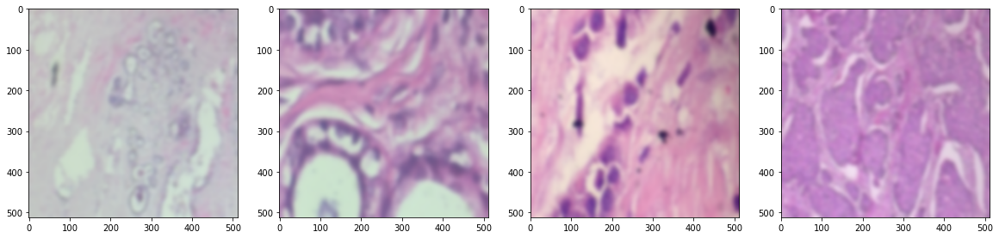

In [10]:
plt.figure(figsize=(20,10))
for i in range(1,5):
    image = cv2.cvtColor(img_list[i-1], cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
    image=cv2.GaussianBlur( image , (0 ,0 ) , 5) 
    plt.subplot(1,4,i)
    plt.imshow(image,cmap='gray')

(512, 512, 3)
(512, 512, 3)
(512, 512, 3)
(512, 512, 3)


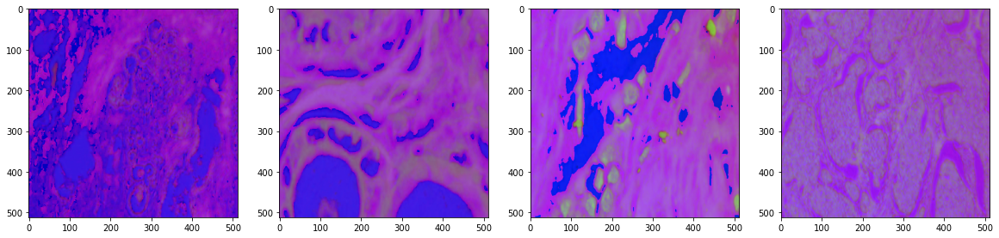

In [11]:
plt.figure(figsize=(20,5))
for i in range(1,5):
    image = cv2.cvtColor(img_list[i-1], cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
    image=cv2.addWeighted ( image, 4 , cv2.GaussianBlur( image , (0 ,0 ) , 30) ,-4 ,128)
    image = cv2.cvtColor(img_list[i-1], cv2.COLOR_BGR2HSV)
    print(image.shape)
    plt.subplot(1,4,i)
    plt.imshow(image)

In [12]:
from scipy.ndimage.filters import median_filter
def unsharp(image, sigma, strength):
        # Median filtering
        image_mf = median_filter(image, sigma)
        # Calculate the Laplacian
        lap = cv2.Laplacian(image_mf,cv2.CV_64F)
        # Calculate the sharpened image
        sharp = image-strength*lap
        
        return sharp

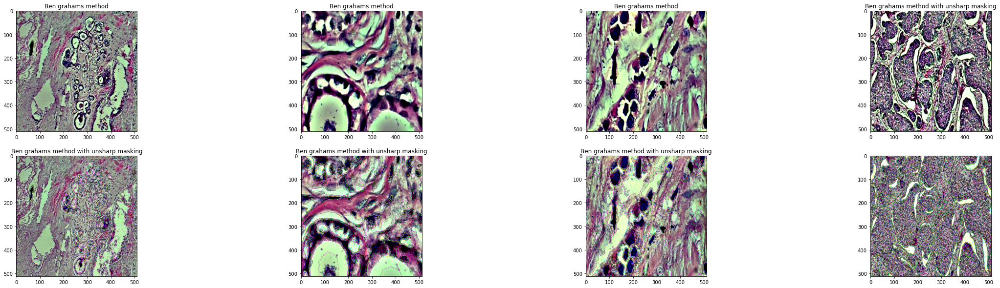

In [13]:
plt.figure(figsize=(40,10))
#Ben grahams method
for i in range(1,5):
    image = cv2.cvtColor(img_list[i-1], cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
    image=cv2.addWeighted ( image, 4 , cv2.GaussianBlur( image , (0 ,0 ) , 30) ,-4 ,128)
    plt.title('Ben grahams method')
    plt.subplot(2,4,i)
    plt.imshow(image)
#Ben grahams method with unsharp masking
for i in range(5,9):
    image = cv2.cvtColor(img_list[i-5], cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
    image = cv2.addWeighted ( image, 4 , cv2.GaussianBlur( image , (0 ,0) , 50) ,-4 ,128)
    for j in range(3):
        image[:,:,j] = unsharp(image[:,:,j], 5, 0.5)
    plt.title('Ben grahams method with unsharp masking')
    plt.subplot(2,4,i)
    plt.imshow(image)

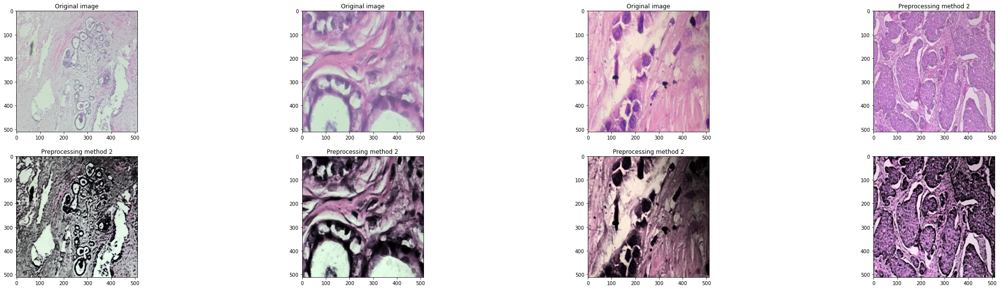

In [14]:
plt.figure(figsize=(40,10))
# Original image
for i in range(1,5):
    image = cv2.cvtColor(img_list[i-1], cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
    plt.title('Original image')
    plt.subplot(2,4,i)
    plt.imshow(image)
# Preprocessing method 2
for i in range(5,9):
    image = cv2.cvtColor(img_list[i-5], cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
    image = cv2.medianBlur(image, 5)
    image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    image[:, :, 2] = cv2.equalizeHist(image[:, :, 2])
    image = cv2.cvtColor(image, cv2.COLOR_HSV2RGB)
    plt.title('Preprocessing method 2')
    plt.subplot(2,4,i)
    plt.imshow(image)    

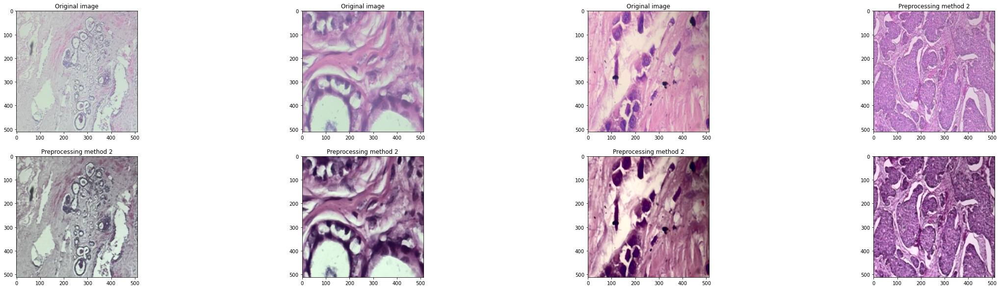

In [15]:
plt.figure(figsize=(40,10))
# Original image
for i in range(1,5):
    image = cv2.cvtColor(img_list[i-1], cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
    plt.title('Original image')
    plt.subplot(2,4,i)
    plt.imshow(image)
# Preprocessing method 2
for i in range(5,9):
    image = cv2.cvtColor(img_list[i-5], cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
    image = cv2.medianBlur(image, 5)
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    lab_planes = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0,tileGridSize=(1,1))
    lab_planes[0] = clahe.apply(lab_planes[0])
    lab = cv2.merge(lab_planes)
    bgr = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)
    plt.title('Preprocessing method 2')
    plt.subplot(2,4,i)
    plt.imshow(bgr)    

In [16]:
def processing2CLAHE(img):
    image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
    image = cv2.medianBlur(image, 5)
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    lab_planes = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0,tileGridSize=(1,1))
    lab_planes[0] = clahe.apply(lab_planes[0])
    lab = cv2.merge(lab_planes)
    bgr = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)
    return bgr
    

In [17]:
def processing2(img):
    image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
    image = cv2.medianBlur(image, 5)
    image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    image[:, :, 2] = cv2.equalizeHist(image[:, :, 2])
    image = cv2.cvtColor(image, cv2.COLOR_HSV2RGB)
    return image

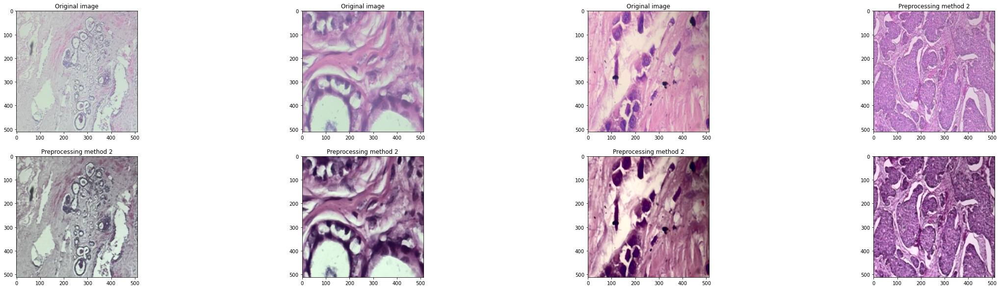

In [18]:
plt.figure(figsize=(40,10))
# Original image
for i in range(1,5):
    image = cv2.cvtColor(img_list[i-1], cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
    plt.title('Original image')
    plt.subplot(2,4,i)
    plt.imshow(image)
# Preprocessing method 2
for i in range(5,9):
    bgr = processing2CLAHE(img_list[i-5])
    plt.title('Preprocessing method 2')
    plt.subplot(2,4,i)
    plt.imshow(bgr)    

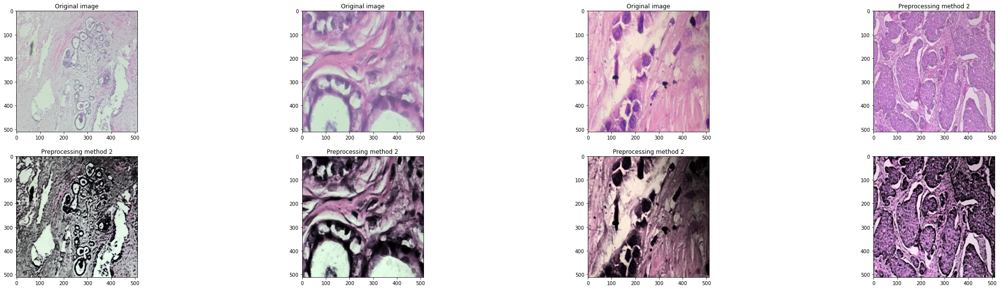

In [19]:
plt.figure(figsize=(40,10))
# Original image
for i in range(1,5):
    image = cv2.cvtColor(img_list[i-1], cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
    plt.title('Original image')
    plt.subplot(2,4,i)
    plt.imshow(image)
# Preprocessing method 2
for i in range(5,9):
    bgr = processing2(img_list[i-5])
    plt.title('Preprocessing method 2')
    plt.subplot(2,4,i)
    plt.imshow(bgr) 